<a href="https://colab.research.google.com/github/Yash-coder-alt/Level_2_Task_/blob/main/Geographic_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [16]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
import folium
from folium.plugins import MarkerCluster , HeatMap

In [2]:
# Load the dataset
df = pd.read_csv("Dataset .csv")  # Ensure the file is in the working directory

In [4]:
# Display the first few rows
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [5]:
# Check the column names
print(df.columns)

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')


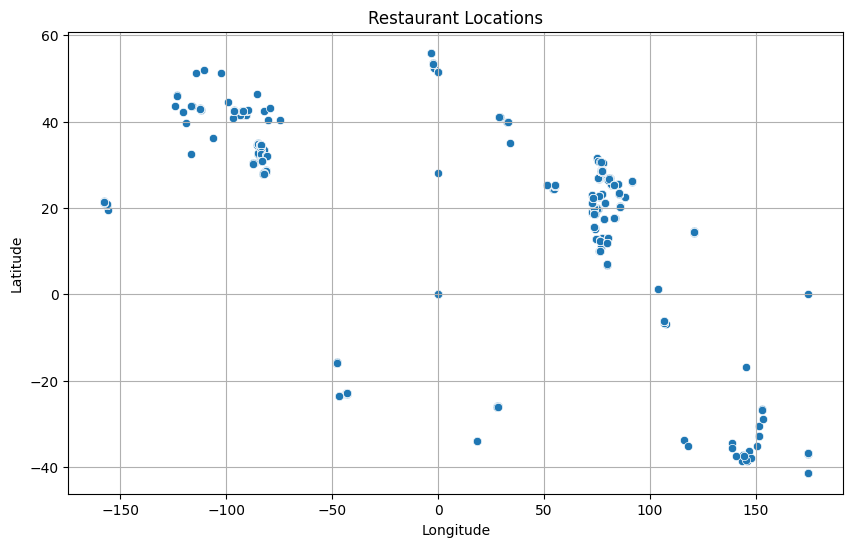

In [8]:
lat_col = 'Latitude'
lon_col = 'Longitude'


# Basic scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x=lon_col, y=lat_col)
plt.title('Restaurant Locations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.show()

In [11]:
# Clustering using DBSCAN
coords = df[[lat_col, lon_col]].dropna()
db = DBSCAN(eps=0.01, min_samples=5, metric='haversine').fit(np.radians(coords))
labels = db.labels_

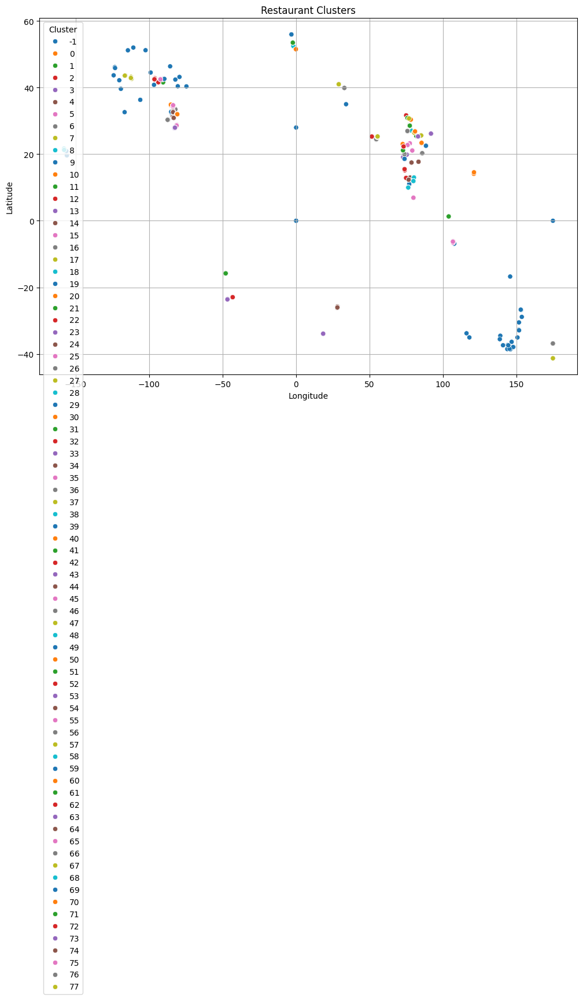

In [12]:
# Add cluster labels back to dataframe
df['cluster'] = -1
df.loc[coords.index, 'cluster'] = labels

# Plot clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(data=df, x=lon_col, y=lat_col, hue='cluster', palette='tab10', legend='full')
plt.title('Restaurant Clusters')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

In [17]:
# Interactive Map with Folium
center_lat = df[lat_col].mean()
center_lon = df[lon_col].mean()

# Create the map
m = folium.Map(location=[center_lat, center_lon], zoom_start=12)

# Add marker clusters
marker_cluster = MarkerCluster().add_to(m)

for idx, row in df.iterrows():
    folium.Marker(
        location=[row[lat_col], row[lon_col]],
        popup=f"Cluster: {row['cluster']}"
    ).add_to(marker_cluster)

# Add heatmap
heat_data = [[row['Latitude'], row['Longitude']] for index, row in df.iterrows() if not np.isnan(row['Latitude']) and not np.isnan(row['Longitude'])]
HeatMap(heat_data).add_to(m)

# Show the map
m